# TEST PROVA

OPEN FILE MIDI

CHECK ALL THE VALUE FOR THE RULE!!!

consigliano di usare la libreria MID pip install mido

mid = mido.MidiFile('song.mid')

for msg in mid.play():

        port.send(msg)

(https://mido.readthedocs.io/en/stable/files/midi.html#)

provare anche un estensione!!

Datasets: MPD-Set

Music Plagiarism Detection Dataset (MPD-Set) is the first (to our best knowledge) publicly available large-scale dataset (2,000 pieces) for the music plagiarism task and can be used by researchers for model design, result validation, etc. It contains a large number of fine-grained plagiarism pairs that more closely resemble real-life plagiarism situations. The original song data for MPD-Set is selected from Wikifonia, an open-sourced dataset with songs collected from samples of real-life songs composed by humans. We obtain song fragments from it in MusicXML format, convert them into the MIDI format commonly used in academia, and further construct MPD-Set.

MPD-Set contains a total of 2,000 pieces of music, which two by two constitute a copying relationship. We design four types of plagiarism for the dataset, taking into account the specific situations of plagiarism in reality: transposition, pitch shifts, duration variance, and melody change, where each accounts for a quarter of the dataset. The specific implications of these four situations are as follows:

Transposition: 
structural transposition of original song.

Pitch Shifts: 
pitch shifts of a fragment of the original song and the addition of it to a completely unrelated song.

Duration Variance: 
a similar operation to pitch shifts, but with a duration variance to the original piece.

Melody Change: melody change of a fragment of the original song, yet through MuseMorphose, a Transformer-based VAE model, and the addition of this fragment to a completely unrelated song.

Structure
The structure of the MPD-Set is as follows:

midi

├───MPD-Set_ori

├───MPD-Set_plag

├───shuffle.xlsx

├───pitch.xlsx

├───duration.xlsx

├───melody.xlsx

npy

├───MPD-Set_ori

├───MPD-Set_plag

MIDI
Due to the different methods of plagiarism in different situations, we introduce the specific methods of various simulated plagiarized content.

Transposition
For the original midi in MPD-Set_ori/shuffle, we randomly divide it into different parts and combine them into new pieces out of order. In shuffle.xlsx, we record the original start time (OST) and original end time (OET) of each part respectively.

Pitch Shifts
Pitch shifts means the pitch of a fragment of the original song is shifted and then added to a completely unrelated song. In pitch.xlsx, we record the plagiarized song name (Name) and original song name (OriFile), the pitch shifted part in the plagiarized song (Start Time, End Time) and the original piece in the original song (Original Start Time, Original End Time).

Duration Variance
Duration variance means the duration of a fragment of the original song is changed and then added to a completely unrelated song. In duration.xlsx, we record the plagiarized song name (Name) and original song name (OriFile), the duration variance part in the plagiarized song (Start Time, End Time) and the original piece in the original song (Original Start Time, Original End Time).

Melody Change
Melody change means the melody of a fragment of the original song is changed and then added to a completely unrelated song. In melody.xlsx, we record the plagiarized song name (Name) and original song name (OriFile), the melody change part in the plagiarized song (Start Time, End Time) and the original piece in the original song (Original Start Time, Original End Time).

In [ ]:
#TRY TO READ A MIDI FILE
import mido

#TEST DURATION!!!!!!
#apro il file midi
file = mido.MidiFile("MPD-Set-20240723T103122Z-001\MPD-Set\midi\MPD-Set_ori\duration\William J. Gaither 1965 - The Longer I Serve Him.mid")

#stampo i dati
print("DURATION")
for i, track in enumerate(file.tracks):
    print(f'Track {i}: {track.name}')
    for msg in track:
        print(msg)

#TEST MELODY!!!!!!
#apro il file midi
file = mido.MidiFile("MPD-Set-20240723T103122Z-001\MPD-Set\midi\MPD-Set_ori\melody\Victor  Schertzinger, Johnny Mercer - Tangerine.mid")

#stampo i dati
print("MELODY")
for i, track in enumerate(file.tracks):
    print(f'Track {i}: {track.name}')
    for msg in track:
        print(msg)

#TEST PITCH!!!!!!
#apro il file midi
mid = mido.MidiFile("MPD-Set-20240723T103122Z-001\MPD-Set\midi\MPD-Set_ori\pitch\Alberto Pestalozza, Jack Lawrence - Ciribiribin.mid")

#stampo i dati
print("PITCH")
for i, track in enumerate(file.tracks):
    print(f'Track {i}: {track.name}')
    for msg in track:
        print(msg)

#TEST SHUFFLE!!!!!!
#apro il file midi
file = mido.MidiFile("MPD-Set-20240723T103122Z-001\MPD-Set\midi\MPD-Set_ori\shuffle\Aaron Schroeder, Sid Wayne - I_m Gonna Knock On Your Door.mid")

#stampo i dati
print("SHUFFLE")
for i, track in enumerate(file.tracks):
    print(f'Track {i}: {track.name}')
    for msg in track:
        print(msg)





- mi sembra di capire che tra pitch duration, melody e shuffle NON CI SIA DIFFERENZA
- ATTENZIONE: mi sembra le canzioni non siano presenti in tutti le quattro cartelle (melody, pitch, etc...), forse perchè sono state accusate di plagio solo per una partee??
- forse il punto precedente non è un probelma perchè qualsissi file midi tiene già tutti i dati??
- CONTROLLARE MEGLIO LA LIBRERIA MID (https://mido.readthedocs.io/en/stable/intro.html)
- capire differenza con tick e tempo

In [ ]:
prova_play = file.play()

In [ ]:
prova_play

In [ ]:
file.print_tracks()

92 -- 9 == message type note on
      2 == channel 2

3C -- note 60 (middle C)

64 -- velocity (how hard the note is hit)

--(https://mido.readthedocs.io/en/stable/about_midi.html)

Time signature of:

4/4 : MetaMessage(‘time_signature’, numerator=4, denominator=4)

3/8 : MetaMessage(‘time_signature’, numerator=3, denominator=8)

https://www.ccarh.org/courses/253/handout/smf/

# FIND MELODY, Vm

In [ ]:
#ABBIAMO VETTORE NOTE -> mmmmmmM M 
def return_melody(file, M):
    for i, track in enumerate(file.tracks):
        print(f'Track {i}: {track.name}')
        for msg in track:
            #if msg.type == 'note_on':
            if msg.type == 'note_off' or (msg.type == 'note_on' and msg.velocity == 0): #ATTENZIONE COSA CAMBIA DA PRENDERE NOTE ON A OFF
                #ATTENZIONE DEVO USARE NOTE OFF SE VOGLAMO AVERE LA STESSA LUNGHEZZA DI Rm!!!!!!
                #print(msg.note)
                M.append(msg.note)

def return_delta(Vm, M):
    for i in range(len(M)-1):
        #print(i)
        #if i+1 <= len(M):
            delta = M[i+1] - M[i]
            Vm.append(delta)
    return Vm

#creo vettore M
M = []

#vreo vettore Vm
Vm = []

#function return M
return_melody(file, M)
print("melody test vector:", M)
#creo Vm
return_delta(Vm, M)
print("vector delta test:", Vm)

#lunghezzza
print("len M:", len(M))
print("len Vm:", len(Vm))
if len(M) == len(Vm):
     print("same len")

In [ ]:
#DOBBIAMO CERCARE RM

for i, track in enumerate(file.tracks):
    print(f'Track {i}: {track.name}')
    for msg in track:
        #print(bpm2tempo(msg.time))
        if msg.time != 0:
            print(mido.tempo2bpm(msg.time)) #mi sembra strano !!!!!
        else:
            print(msg.time)
            #SBAGLIATO, tempo2bpm è da usare sul TIMESIGNATURE (2/2)
            

# RM

duration_per_tick = tempo / ticks_per_quarter_note
                  = 500,000 μs / 480
                  ≈ 1041.67 μs

note_duration = duration_per_tick * ticks
              = 1041.67 μs/tick * 512 ticks
              ≈ 533333.34 μs

note_duration_seconds = note_duration / 1,000,000
                      ≈ 0.533 seconds


In [ ]:
ticks_per_beat = mid.ticks_per_beat
ticks_per_beat

In [ ]:
def tick_to_time_test2(ticks, tempo, ticks_per_quarter_note):

    duration_per_tick = tempo / ticks_per_quarter_note
    note_duration = duration_per_tick * ticks
    note_duration_seconds = note_duration / 1000000
    
    return note_duration_seconds

In [ ]:
import mido

# Function to convert ticks to time in seconds
def ticks_to_time(ticks, tempo, ticks_per_beat):
    return (ticks * tempo) / (ticks_per_beat * 1_000_000)

# Function to convert ticks to time in seconds, TEST2
def tick_to_time_test2(ticks, tempo, ticks_per_quarter_note):
    
    #print(f"ticks:{ticks}, tempo:{tempo}, ticks_per:{ticks_per_quarter_note}")
    duration_per_tick = tempo / ticks_per_quarter_note
    #print("1:",duration_per_tick)
    note_duration = duration_per_tick * ticks
    #print("2:",note_duration)
    note_duration_seconds = note_duration / 1000000
    #print("3:",note_duration_seconds)
    
    return note_duration_seconds

# Open the MIDI file
mid = mido.MidiFile('MPD-Set-20240723T103122Z-001\MPD-Set\midi\MPD-Set_ori\duration\William J. Gaither 1965 - The Longer I Serve Him.mid')


# Get ticks per beat from the MIDI file
ticks_per_beat = mid.ticks_per_beat

# Default tempo (microseconds per beat)
current_tempo = 500000

# Dictionary to keep track of note start times
note_start_times = {}

# List to store note durations
note_durations = []

#list to store note duration test 2
note_duration_test2 = []

for i, track in enumerate(mid.tracks):
    print(f'Track {i}: {track.name}')
    current_time = 0  # Initialize current time
    for msg in track:
        current_time += ticks_to_time(msg.time, current_tempo, ticks_per_beat)
        if msg.type == 'set_tempo':
            current_tempo = msg.tempo
        elif msg.type == 'note_on' and msg.velocity > 0:
            # Note on: start timing this note
            note_start_times[msg.note] = current_time
            #ATTENZIONE LE NTE ON HANNO TIME = 0
            #note_duration_test2.append(tick_to_time_test2(msg.time, current_tempo, ticks_per_beat))  #CAPIRE IL VERO VALORE DI TICKS PER BEATS (480 OPPURE VEDERE METAMESSAGE "END SONG")
        elif msg.type == 'note_off' or (msg.type == 'note_on' and msg.velocity == 0):
            # Note off: calculate the duration
            
            #TEST 2 duration
            note_duration_test2.append(tick_to_time_test2(msg.time, current_tempo, ticks_per_beat))  #CAPIRE IL VERO VALORE DI TICKS PER BEATS (480 OPPURE VEDERE METAMESSAGE "END SONG")
            
            #TEST duration
            if msg.note in note_start_times:
                start_time = note_start_times[msg.note]
                duration = current_time - start_time
                note_durations.append((msg.note, start_time, duration))
                del note_start_times[msg.note]

# Print the note durations
for note, start_time, duration in note_durations:
    print(f'Note {note} started at {start_time:.2f} seconds and lasted for {duration:.2f} seconds')


#TEST PRINT:
for duration1, duration2 in zip(note_durations, note_duration_test2):
    print(f"normal: ",duration1)
    print(f"test2: ", duration2)

print(note_duration_test2)



In [ ]:
M = []
return_melody(mid, M)
len(M)

In [ ]:
len(note_durations)

In [ ]:
len(note_duration_test2)

# CREAZIONE DIZIONARIO PER CONTENERE VARIABILI CANZONI MIDI

In [ ]:
#dict_song_midi_ori = {
#    "song":
#    "M":
#    "Vm":
#    "Rm":
#} #DA FINIRE

# TEST COMPLETO M, VM, RM

In [ ]:
import mido

In [ ]:
#ABBIAMO VETTORE NOTE -> mmmmmmM M 
def return_melody(file, M):
    for i, track in enumerate(file.tracks):
        print(f'Track {i}: {track.name}')
        for msg in track:
            #if msg.type == 'note_on':
            if msg.type == 'note_off' or (msg.type == 'note_on' and msg.velocity == 0): #ATTENZIONE COSA CAMBIA DA PRENDERE NOTE ON A OFF
                #ATTENZIONE DEVO USARE NOTE OFF SE VOGLAMO AVERE LA STESSA LUNGHEZZA DI Rm!!!!!!
                #print(msg.note)
                M.append(msg.note)

def return_delta(Vm, M):
    for i in range(len(M)-1):
        #print(i)
        #if i+1 <= len(M):
            delta = M[i+1] - M[i]
            Vm.append(delta)
    return Vm

#open midi file
mid = mido.MidiFile('MPD-Set-20240723T103122Z-001\MPD-Set\midi\MPD-Set_ori\duration\William J. Gaither 1965 - The Longer I Serve Him.mid')

#creo vettore M
M = []

#vreo vettore Vm
Vm = []

#function return M
return_melody(mid, M)
print("melody test vector:", M)
#creo Vm
return_delta(Vm, M)
print("vector delta test:", Vm)

#lunghezzza
print("len M:", len(M))
print("len Vm:", len(Vm))
if len(M) == len(Vm):
     print("same len")

In [ ]:
import mido

# Function to convert ticks to time in seconds
def ticks_to_time(ticks, tempo, ticks_per_beat):
    return (ticks * tempo) / (ticks_per_beat * 1_000_000)

# Function to convert ticks to time in seconds, TEST2
def tick_to_time_test2(ticks, tempo, ticks_per_quarter_note):
    
    #print(f"ticks:{ticks}, tempo:{tempo}, ticks_per:{ticks_per_quarter_note}")
    duration_per_tick = tempo / ticks_per_quarter_note
    #print("1:",duration_per_tick)
    note_duration = duration_per_tick * ticks
    #print("2:",note_duration)
    note_duration_seconds = note_duration / 1000000
    #print("3:",note_duration_seconds)
    
    return note_duration_seconds

# Open the MIDI file
mid = mido.MidiFile('MPD-Set-20240723T103122Z-001\MPD-Set\midi\MPD-Set_ori\duration\William J. Gaither 1965 - The Longer I Serve Him.mid')

# Get ticks per beat from the MIDI file
ticks_per_beat = mid.ticks_per_beat

# Default tempo (microseconds per beat)
current_tempo = 500000 #non serve cambiare è solo u modo per calcolare il tempo normale

# Dictionary to keep track of note start times
note_start_times = {}

# List to store note durations
note_durations = []

#list to store note duration test 2
note_duration_test2 = []

for i, track in enumerate(mid.tracks):
    print(f'Track {i}: {track.name}')
    current_time = 0  # Initialize current time
    for msg in track:
        current_time += ticks_to_time(msg.time, current_tempo, ticks_per_beat)
        if msg.type == 'set_tempo':
            current_tempo = msg.tempo
        elif msg.type == 'note_on' and msg.velocity > 0:
            # Note on: start timing this note
            note_start_times[msg.note] = current_time
            #ATTENZIONE LE NTE ON HANNO TIME = 0
            #note_duration_test2.append(tick_to_time_test2(msg.time, current_tempo, ticks_per_beat))  #CAPIRE IL VERO VALORE DI TICKS PER BEATS (480 OPPURE VEDERE METAMESSAGE "END SONG")
        elif msg.type == 'note_off' or (msg.type == 'note_on' and msg.velocity == 0):
            # Note off: calculate the duration
            
            #TEST 2 duration
            note_duration_test2.append(tick_to_time_test2(msg.time, current_tempo, ticks_per_beat))  #CAPIRE IL VERO VALORE DI TICKS PER BEATS (480 OPPURE VEDERE METAMESSAGE "END SONG")
            
            #TEST duration
            if msg.note in note_start_times:
                start_time = note_start_times[msg.note]
                duration = current_time - start_time
                note_durations.append((msg.note, start_time, duration))
                del note_start_times[msg.note]

# Print the note durations
for note, start_time, duration in note_durations:
    print(f'Note {note} started at {start_time:.2f} seconds and lasted for {duration:.2f} seconds')


#TEST PRINT:
for duration1, duration2 in zip(note_durations, note_duration_test2):
    print(f"normal: ",duration1)
    print(f"test2: ", duration2)

print(note_duration_test2)
print(len(note_duration_test2))



In [ ]:
mid = mido.MidiFile('MPD-Set-20240723T103122Z-001\MPD-Set\midi\MPD-Set_ori\duration\William J. Gaither 1965 - The Longer I Serve Him.mid')
mid.tracks[0]

In [ ]:
# fare check per Vm e Rm su una size di 0 -> len(Vm)

# UPDATE M, RM, VM 

In [ ]:
import mido
import math
import numpy as np

In [ ]:
#test liSTA DI DIZIONARI

def return_melody(file):
    M = []
    for i, track in enumerate(file.tracks):
        #print(f'Track {i}: {track.name}')
        for msg in track:
            #if msg.type == 'note_on':
            if msg.type == 'note_off' or (msg.type == 'note_on' and msg.velocity == 0): #ATTENZIONE COSA CAMBIA DA PRENDERE NOTE ON A OFF
                #ATTENZIONE DEVO USARE NOTE OFF SE VOGLAMO AVERE LA STESSA LUNGHEZZA DI Rm!!!!!!
                #print(msg.note)
                M.append(msg.note)
    return M

def return_delta(M):
    Vm = []
    for i in range(len(M)-1):
        #print(i)
        #if i+1 <= len(M):
            delta = M[i+1] - M[i]
            Vm.append(delta)
    return Vm

# Function to convert ticks to time in seconds, TEST2
def tick_to_time_test2(ticks, tempo, ticks_per_quarter_note):
    
    #print(f"ticks:{ticks}, tempo:{tempo}, ticks_per:{ticks_per_quarter_note}")
    duration_per_tick = tempo / ticks_per_quarter_note
    #print("1:",duration_per_tick)
    note_duration = duration_per_tick * ticks
    #print("2:",note_duration)
    note_duration_seconds = note_duration / 1000000
    #print("3:",note_duration_seconds)
    
    return note_duration_seconds

# Function to check the message for the def tick to time
def loop_duration_note(mid):

    # Get ticks per beat from the MIDI file
    ticks_per_beat = mid.ticks_per_beat

    #list of note duration
    note_duration_test2 = []

    for i, track in enumerate(mid.tracks): # CONTROLLARE SE LE CANZONI HANNO PIù TRACCE, IN CASO DEVO CREARE PIù M, VM, RM PER TRACCIA???????????????????
        for msg in track:
            #current_time += ticks_to_time(msg.time, current_tempo, ticks_per_beat)
            if msg.type == 'set_tempo': #take tempo of ticks -> track 0
                current_tempo = msg.tempo
            elif msg.type == 'note_off' or (msg.type == 'note_on' and msg.velocity == 0):
                # Note off: calculate the duration
                
                #TEST 2 duration
                note_duration_test2.append(tick_to_time_test2(msg.time, current_tempo, ticks_per_beat))  #CAPIRE IL VERO VALORE DI TICKS PER BEATS (480 OPPURE VEDERE METAMESSAGE "END SONG")

    return note_duration_test2            


#---------------------------------------------------

#INPUT!!!

dict = {
    "name_song": "",
    "M": [],
    "Vm": [],
    "Rm": [],
}

#list dict for each song
list_song = []

#lista provissoria per nomi canzoni: -> update leggere folder!!
#lista_nomi = ['MPD-Set-20240723T103122Z-001\MPD-Set\midi\MPD-Set_ori\duration\William J. Gaither 1965 - The Longer I Serve Him.mid', "MPD-Set-20240723T103122Z-001\MPD-Set\midi\MPD-Set_ori\shuffle\Aaron Schroeder, Sid Wayne - I_m Gonna Knock On Your Door.mid"]
#lista_nomi = ['MPD-Set-20240723T103122Z-001\MPD-Set\midi\MPD-Set_ori\duration\William J. Gaither 1965 - The Longer I Serve Him.mid','MPD-Set-20240723T103122Z-001\MPD-Set\midi\MPD-Set_ori\duration\William J. Gaither 1965 - The Longer I Serve Him.mid']
#lista_nomi = ['MPD-Set-20240723T103122Z-001\MPD-Set\midi\MPD-Set_plag\duration\Aaron Schroeder, Claude DeMetrius, Bruce Sussman, Jack Feldman - Santa Bring My Baby Back (to Me).mid','MPD-Set-20240723T103122Z-001\MPD-Set\midi\MPD-Set_plag\duration\Aaron Schroeder, Claude DeMetrius, Bruce Sussman, Jack Feldman - Santa Bring My Baby Back (to Me).mid']
#lista_nomi = ['BMMDet_MPDSet-master\BMMDet_MPDSet-master\data\midi\dataset_real_ori\case1_song_a.mid','BMMDet_MPDSet-master\BMMDet_MPDSet-master\data\midi\dataset_real_plag\case1_song_b.mid']
lista_nomi = ['BMMDet_MPDSet-master\BMMDet_MPDSet-master\data\midi\dataset_real_ori\case1_song_a.mid','BMMDet_MPDSet-master\BMMDet_MPDSet-master\data\midi\dataset_real_ori\case1_song_a.mid']

#scorro le canzoni: -> update folder
for i in lista_nomi:
    
    #opne file midi
    mid = mido.MidiFile(i)

    #CREO M
    M = return_melody(mid)
    #print(M)

    #CREO Vm
    Vm = return_delta(M)
    print("Vm:", Vm)

    #CREO Rm
    #list to store note duration test 2
    Rm = loop_duration_note(mid)
    print("Rm:", Rm)

    dict = {"name_song": mid.filename, "M":M, "Vm":Vm, "Rm":Rm}
    list_song.append(dict)

    #print(len(M))
    #print(len(Vm))
    print(len(Rm))

#print(list_song[0]["name_song"])
#for i in list_song:
    #print(len(i["M"]), len(i["Vm"]))
    #print(i["Vm"])

#creo kappa (SPECIFICARE K)
k = find_k(list_song[0], list_song[1])

#find subset of Vm for the 2 songs based on kappa
sub_Vm_1 = return_subset_of_Vm(list_song[0]["Vm"], k) #s1
sub_Vm_2 = return_subset_of_Vm(list_song[1]["Vm"], k) #s2
#print(sub_Vm_1)
#print(sub_Vm_2)

#calulate the distance for Vm used s1, s2 (subsets)
dist_sub_Vm = melodic_vector_distance(sub_Vm_1, sub_Vm_2, list_song)
print("distance_Vm:",dist_sub_Vm)

#find the subset of Rm for the 2 songs based on kappa
sub_Rm_1 = return_subset_of_Rm(list_song[0]["Rm"], k) #s1
sub_Rm_2 = return_subset_of_Rm(list_song[1]["Rm"], k) #s2
print("a:",len(sub_Rm_1))
print("b:",len(sub_Rm_2))

##calulate the distance for Rm used z1, z2 (subsets)
dist_sub_Rm = melodic_vector_distance(sub_Rm_1, sub_Rm_2, list_song)
print("distance_Rm:",dist_sub_Rm)

#jaccard similarity
js_vm = jaccard_similarity(set(sub_Vm_1), set(sub_Vm_2))
js_rm = jaccard_similarity(set(sub_Rm_1), set(sub_Rm_2))
print("jaccard Vm:",js_vm)
print("jaccard Rm:",js_rm)

#k_shingles test
k_shingles = 5

#average jaccard similarity
ajs_vm = average_jaccard_similarity(list_song, k, k_shingles)
print("average jaccard similarity for Vm:", ajs_vm)
ajs_rm = average_jaccard_similarity_Rm(list_song, k, k_shingles)
print("average jaccard similarity for Rm:", ajs_rm)

# DEFINIZIONE DI K

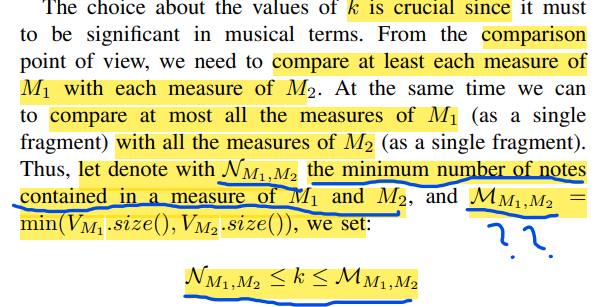

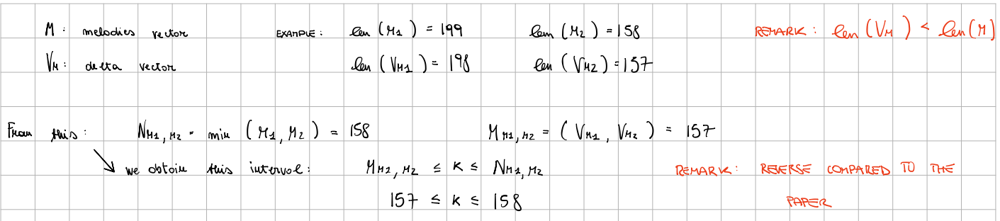

In [1]:
import numpy as np
# FARE RIFERIMENTO AL TEST ESEMPIO; SEMPBRA SBAGLIATO L'INTERVALLO 200,300<K<199,299!!!!
#find a random k (RICONTROLLARE)
def find_k (song1, song2):
    
    min_M = len(song2["M"])
    if len(song1["M"]) < len(song2["M"]):
        min_M = len(song1["M"])
    min_Vm = len(song2["Vm"])
    if(len(song1["Vm"]) < len(song2["Vm"])):
        min_Vm = len(song1["Vm"])
    
    #POI VERIFICHIAMO CON DIVERSI KAPPA IL LIVELLO DI PLAGIO (DATO CHE KAPPA E SCELTO A RNG)

    #rng
    if(min_M < min_Vm):
        k = np.random.randint(low=min_M, high=min_Vm)
    else:
        k = np.random.randint(low = min_Vm, high=min_M)

    return k
    

# CREATION OF SUBSETS (Sk)

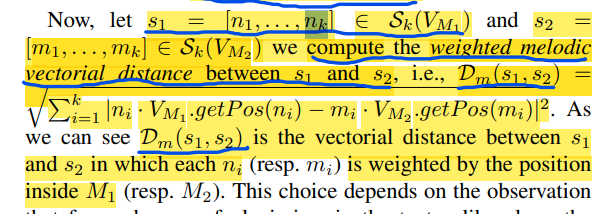

In [2]:
def return_subset_of_Vm(Vm, k):
    return Vm[0:k]

# COMPUTE THE WEIGHTED MELODIC VECTORIAL DISTANCE BETWEEN SUBSETS

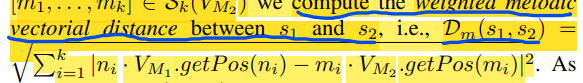

In [3]:
import math
import numpy as np

In [4]:
#s1 : sub_Vm_1
#s2 : sub_Vm_2
def melodic_vector_distance(s1, s2, list_song):
    
    distance = 0
    #print(s1)
    #print(s2)
    
    #calculate the eeuclidean distance
    for i in range(len(s1)):#range s1 becouse is long k
        
        #print("i",i)
        punto1 = s1[i] * (i+1) #attenzione in caso controllare se fare Vm1.index(s1[i])
        punto2 = s2[i] * (i+1)
        #print("a",punto1)
        #print(punto2)
        absolute_value = abs(punto1 - punto2)
        sqrt_abs_value = np.power(absolute_value, 2)
        distance += sqrt_abs_value

    #print("distance_before_sqrt: ", distance)    
    distance_sub_Vm = np.sqrt(distance)
    #print("distance: ", distance)
    
    return distance_sub_Vm

# CREATION OF SUBSETS (Rk)

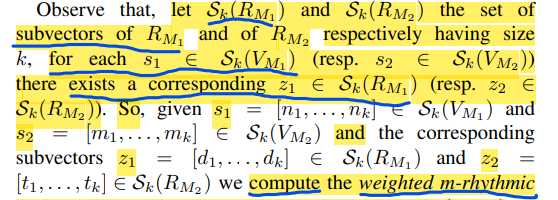

In [5]:
def return_subset_of_Rm(Rm, k):
    return Rm[0:k]

# COMPUTE THE WEIGHTED MELODIC VECTORIAL DISTANCE BETWEEN SUBSETS

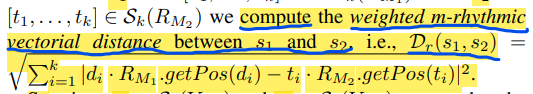

In [6]:
import numpy as np

In [7]:
#s1 : sub_Vm_1
#s2 : sub_Vm_2
def rhythmic_vector_distance(z1, z2, list_song):
    
    distance = 0
    #print(s1)
    #print(s2)
    
    #calculate the eeuclidean distance
    for i in range(len(z1)):#range s1 becouse is long k
        
        #print("i",i)
        punto1 = z1[i] * (i+1) #attenzione in caso controllare se fare Vm1.index(s1[i])
        punto2 = z2[i] * (i+1)
        #print("a",punto1)
        #print(punto2)
        absolute_value = abs(punto1 - punto2)
        sqrt_abs_value = np.power(absolute_value, 2)
        distance += sqrt_abs_value

    #print("distance_before_sqrt: ", distance)    
    distance_sub_Rm = np.sqrt(distance)
    #print("distance: ", distance_sub_Rm)
    
    return distance_sub_Rm

# TOTAL DISTANCE (VECTORIAL MEODIC DISTANCE)

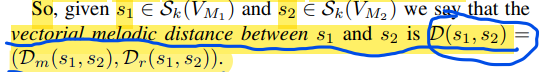

In [8]:
#distance = (distance_sub_Vm, distance_sib_Rm)
#rappresentazione finale delle distanze

# JACCARD SIMILARITY

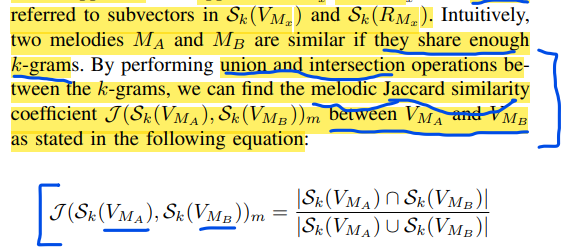

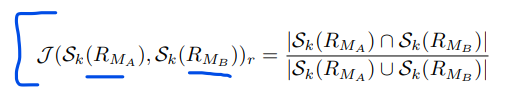

In [9]:
# for Vm and Rm

def jaccard_similarity(vector_a, vector_b):
    
    num = vector_a.intersection(vector_b)
    den = vector_a.union(vector_b)
    jaccard_result = float(len(num))/float(len(den))

    #print('AnB = ', num)
    #print('AUB = ', den)
    #print('J(A,B) = ', round(jaccard_result, 4))
    
    return round(jaccard_result, 4)

# AVERAGE JACCARD SIMILARITY

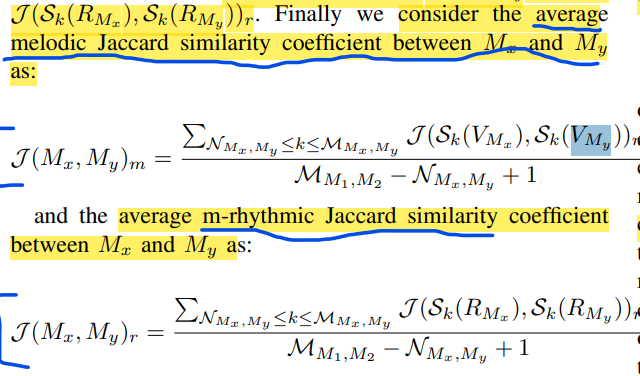

se Mm1m2 è il minimo lunghezza dei Vm 

se Nm1m2 è il minimo lunghezza delle melodie (M)

il risultato sarà sempre 0!!??

attenzione: a causa della poca chiarezza nell'esposizione dell calcolo di K e del average jaccard similarity abbiamo assunto che il numeratore è una sommatoria che va da 1 a k e il denominatore è il numero di simulazione = k

oppure rifare ttutto e Mx, My è un sottoinsieme di M1,M2

oppure
-   Mx melodia sospetta di una canzone M1
-   My melodia della canzone 2, 
-   devo confrontare Mx con tutte le melodia My che appartengon a M2 (nel nostro caso abbiamo una sola melodia, non ha senso farlo dobbiamo cercare un altro data set con più meoldie)



controllare prova test codice average -> after breafing

In [10]:
#def average_jaccard_similarity (list_song, k):
    
#    similarity = 0
#    sum_jacc = 0
    
#    for i in range(k): #da 0 a k-1
        
        #creation subset
#        subset_Vm1 = return_subset_of_Vm(list_song[0]["Vm"], k = i+1)
#        subset_Vm2 = return_subset_of_Vm(list_song[1]["Vm"], k = i+1)
        #jaccard similarity
#        sum_jacc += jaccard_similarity(subset_Vm1, sub_Vm_2)
    
#    avg_jacc = sum_jacc / k

In [11]:
def return_subset_shingles(subset_Vm, k_shingles):

    list_shin = []

    for i in range(len(subset_Vm)- k_shingles +1):
        list_shin.append(subset_Vm[i:i+k_shingles])
    
    return list_shin
    
    #return [subset_Vm[i:i+k] for i in range(len(subset_Vm) - k + 1)]

## Vm

In [12]:
#Vm
def average_jaccard_similarity(list_song, k, k_shingles):
    
    #1) creation of subset Vm1 and subset Vm2
    subset_Vm1 = return_subset_of_Vm(list_song[0]["Vm"], k) #Sk(Vm1)
    subset_Vm2 = return_subset_of_Vm(list_song[1]["Vm"], k) #Sk(Vm2)

    #2)divide subset based on len k_shingles
    k_shingles_x = return_subset_shingles(subset_Vm1, k_shingles)
    print("k_shingles:",k_shingles_x)
    k_shingles_y = return_subset_shingles(subset_Vm2, k_shingles)
    print("k_shingles:", k_shingles_y)

    #3)Compute local jaccard similarity / initialize average jaccard similarity

    #total
    similarities = []

    for x in k_shingles_x:

        #print("x:", x)
        set_x = set(x)
        #print("set_x:", set_x)

        #local -> only a small part (len = to k_shingles) is confront
        local_similarities = []
        
        for y in k_shingles_y:

            #print("y:", y)
            set_y = set(y)
            #print("set_y:", set_y)

            similarity = jaccard_similarity(set_x, set_y)
            local_similarities.append(similarity)

        if local_similarities:
            
            max_similarity = max(local_similarities) #USA MAX PER DARE PESO ALLA MASSIMA SIMILARITA RISCONTRATA
            #PROVARE A PASSARE LA MEDIA E NON IL MASSIMO!!!!!!
            similarities.append(max_similarity)
    
    #4) compute the average similaities
    if similarities:
        return sum(similarities) / len(similarities)
    else:
        return 0




## Rm

In [13]:
#Rm
def average_jaccard_similarity_Rm(list_song, k, k_shingles):
    
    #1) creation of subset Vm1 and subset Vm2
    subset_Rm1 = return_subset_of_Rm(list_song[0]["Rm"], k) #Sk(Vm1)
    subset_Rm2 = return_subset_of_Rm(list_song[1]["Rm"], k) #Sk(Vm2)

    #2)divide subset based on len k_shingles
    k_shingles_x = return_subset_shingles(subset_Rm1, k_shingles)
    print("k_shingles_Rmx:",k_shingles_x)
    k_shingles_y = return_subset_shingles(subset_Rm2, k_shingles)
    print("k_shingles_Rmy:", k_shingles_y)

    #3)Compute local jaccard similarity / initialize average jaccard similarity

    #total
    similarities = []

    for x in k_shingles_x:

        #print("x:", x)
        set_x = set(x)
        #print("set_x:", set_x)

        #local -> only a small part (len = to k_shingles) is confront
        local_similarities = []
        
        for y in k_shingles_y:

            #print("y:", y)
            set_y = set(y)
            #print("set_y:", set_y)

            similarity = jaccard_similarity(set_x, set_y)
            local_similarities.append(similarity)

        if local_similarities:
            
            max_similarity = max(local_similarities) #USA MAX PER DARE PESO ALLA MASSIMA SIMILARITA RISCONTRATA
            #PROVARE A PASSARE LA MEDIA E NON IL MASSIMO!!!!!!
            similarities.append(max_similarity)
    
    #4) compute the average similaities
    if similarities:
        return sum(similarities) / len(similarities)
    else:
        return 0




# TEST READ ALL THE SONGS

In [14]:
import os
import mido

path = "MPD-Set-20240723T103122Z-001\MPD-Set\midi\MPD-Set_plag\duration"
# 'MPD-Set-20240723T103122Z-001\MPD-Set\midi\MPD-Set_ori\duration\William J. Gaither 1965 - The Longer I Serve Him.mid'
dir_list = os.listdir(path)
print(len(dir_list))

for i in range(0,1):
    #song = "'" + path + '\\' + dir_list[i] + "'"
    song_2 = path + '\\' + dir_list[i]
    #print(song)
    print(song_2)
    mid = mido.MidiFile(song_2)
    #print(mid.tracks)
    

#for i in dir_list:
#    song = "'" + path + '\\' + i + "'"
#    print(song)

250
MPD-Set-20240723T103122Z-001\MPD-Set\midi\MPD-Set_plag\duration\Aaron Schroeder, Claude DeMetrius, Bruce Sussman, Jack Feldman - Santa Bring My Baby Back (to Me).mid


# LOOP ON ALL THE SONG -> UPDATE -> FOR THE MPD-Set 

In [15]:
import numpy as np
import mido 

In [16]:
def name_all_song(path):

    lista_nomi = []
    #path directori
    #path = "MPD-Set-20240723T103122Z-001\MPD-Set\midi\MPD-Set_ori\duration"
    #path = 
    # 'MPD-Set-20240723T103122Z-001\MPD-Set\midi\MPD-Set_ori\duration\William J. Gaither 1965 - The Longer I Serve Him.mid'
    dir_list = os.listdir(path)
    #print(len(dir_list))

    for i in range(len(dir_list)): #scorro tutte le canzoni
        song_2 = path + '\\' + dir_list[i] #write name first song
        #print(song)
        #print(song_2)
        lista_nomi.append(song_2) #save name song
        #mid = mido.MidiFile(song_2) #open the song
        #print(mid.tracks)
    
    return lista_nomi

In [17]:
#test liSTA DI DIZIONARI

def return_melody(file):
    M = []
    for i, track in enumerate(file.tracks):
        #print(f'Track {i}: {track.name}')
        for msg in track:
            #if msg.type == 'note_on':
            if msg.type == 'note_off' or (msg.type == 'note_on' and msg.velocity == 0): #ATTENZIONE COSA CAMBIA DA PRENDERE NOTE ON A OFF
                #ATTENZIONE DEVO USARE NOTE OFF SE VOGLAMO AVERE LA STESSA LUNGHEZZA DI Rm!!!!!!
                #print(msg.note)
                M.append(msg.note)
    return M

def return_delta(M):
    Vm = []
    for i in range(len(M)-1):
        #print(i)
        #if i+1 <= len(M):
            delta = M[i+1] - M[i]
            Vm.append(delta)
    return Vm

# Function to convert ticks to time in seconds, TEST2
def tick_to_time_test2(ticks, tempo, ticks_per_quarter_note):
    
    #print(f"ticks:{ticks}, tempo:{tempo}, ticks_per:{ticks_per_quarter_note}")
    duration_per_tick = tempo / ticks_per_quarter_note
    #print("1:",duration_per_tick)
    note_duration = duration_per_tick * ticks
    #print("2:",note_duration)
    note_duration_seconds = note_duration / 1000000
    #print("3:",note_duration_seconds)
    
    return note_duration_seconds

# Function to check the message for the def tick to time
def loop_duration_note(mid):

    # Get ticks per beat from the MIDI file
    ticks_per_beat = mid.ticks_per_beat

    current_tempo = 500000 #attenzione inserito perchè mi dava probelmi, non so perchè!!
    
    #list of note duration
    note_duration_test2 = []

    for i, track in enumerate(mid.tracks): # CONTROLLARE SE LE CANZONI HANNO PIù TRACCE, IN CASO DEVO CREARE PIù M, VM, RM PER TRACCIA???????????????????
        for msg in track:
            #current_time += ticks_to_time(msg.time, current_tempo, ticks_per_beat)
            if msg.type == 'set_tempo': #take tempo of ticks -> track 0
                current_tempo = msg.tempo
            elif msg.type == 'note_off' or (msg.type == 'note_on' and msg.velocity == 0):
                # Note off: calculate the duration
                
                #TEST 2 duration
                note_duration_test2.append(tick_to_time_test2(msg.time, current_tempo, ticks_per_beat))  #CAPIRE IL VERO VALORE DI TICKS PER BEATS (480 OPPURE VEDERE METAMESSAGE "END SONG")

    return note_duration_test2            


#---------------------------------------------------

#UPDATE -> ADD LOOP ON ALL THE SONG

#INPUT!!!

dict = {
    "name_song": "",
    "M": [],
    "Vm": [],
    "Rm": [],
}

dict_check = {
    "plag_song": "",
    "original_song": "",
    "ajs_vm": "",
    "ajs_rm": ""
}

#add loop to check all the song

#list to store the name of songs : take from original directory
lista_nomi = name_all_song("MPD-Set-20240723T103122Z-001\MPD-Set\midi\MPD-Set_ori\duration")

#suspected melody: Mx; take from plag directory, prendere un altra canzone
#name_sus_song = 'MPD-Set-20240723T103122Z-001\MPD-Set\midi\MPD-Set_ori\duration\William J. Gaither 1965 - The Longer I Serve Him.mid'
name_sus_song = 'MPD-Set-20240723T103122Z-001\MPD-Set\midi\MPD-Set_plag\duration\Aaron Schroeder, Claude DeMetrius, Bruce Sussman, Jack Feldman - Santa Bring My Baby Back (to Me).mid'
mid_sus = mido.MidiFile(name_sus_song)
M = return_melody(mid_sus)
Vm = return_delta(M)
Rm = loop_duration_note(mid)
sus_song = {"name_song": mid_sus.filename, "M":M, "Vm":Vm, "Rm":Rm}

#list dict for each song
list_song = []

#lista provissoria per nomi canzoni: -> update leggere folder!!
#lista_nomi = ['MPD-Set-20240723T103122Z-001\MPD-Set\midi\MPD-Set_ori\duration\William J. Gaither 1965 - The Longer I Serve Him.mid', "MPD-Set-20240723T103122Z-001\MPD-Set\midi\MPD-Set_ori\shuffle\Aaron Schroeder, Sid Wayne - I_m Gonna Knock On Your Door.mid"]
#lista_nomi = ['MPD-Set-20240723T103122Z-001\MPD-Set\midi\MPD-Set_ori\duration\William J. Gaither 1965 - The Longer I Serve Him.mid','MPD-Set-20240723T103122Z-001\MPD-Set\midi\MPD-Set_ori\duration\William J. Gaither 1965 - The Longer I Serve Him.mid']

#scorro le canzoni: -> update folder

#u =0

#for each song create a dict with M,Vm,Rm

#print("PROVA")

for i in lista_nomi:
    #print(i)
    #print(u)
    #u+=1

    #opne file midi
    mid = mido.MidiFile(i)

    #CREO M
    M = return_melody(mid)
    #print(M)

    #CREO Vm
    Vm = return_delta(M)
    #print(Vm)

    #CREO Rm
    #list to store note duration test 2
    Rm = loop_duration_note(mid)
    #print(Rm)

    dict = {"name_song": mid.filename, "M":M, "Vm":Vm, "Rm":Rm}
    list_song.append(dict)

    #print(len(M))
    #print(len(Vm))
    #print(len(Rm))

#print(list_song[0]["name_song"])
#for i in list_song:
    #print(len(i["M"]), len(i["Vm"]))
    #print(i["Vm"])

list_final = []

#CHECK SUS_SONG WITH ALL THE OTHER SONG
for i in range(len(list_song)):

    #creo kappa (SPECIFICARE K)
    k = find_k(sus_song, list_song[i])

    #find subset of Vm for the 2 songs based on kappa
    sub_Vm_1 = return_subset_of_Vm(sus_song["Vm"], k) #s1
    sub_Vm_2 = return_subset_of_Vm(list_song[i]["Vm"], k) #s2
    #print(sub_Vm_1)
    #print(sub_Vm_2)

    #calulate the distance for Vm used s1, s2 (subsets)
    dist_sub_Vm = melodic_vector_distance(sub_Vm_1, sub_Vm_2, list_song)
    print("distance_Vm:",dist_sub_Vm)

    #find the subset of Rm for the 2 songs based on kappa
    sub_Rm_1 = return_subset_of_Rm(sus_song["Rm"], k) #s1
    sub_Rm_2 = return_subset_of_Rm(list_song[i]["Rm"], k) #s2
    print("a:",len(sub_Rm_1))
    print("b:",len(sub_Rm_2))

    ##calulate the distance for Rm used z1, z2 (subsets)
    dist_sub_Rm = melodic_vector_distance(sub_Rm_1, sub_Rm_2, list_song)
    print("distance_Rm:",dist_sub_Rm)

    #jaccard similarity
    js_vm = jaccard_similarity(set(sub_Vm_1), set(sub_Vm_2))
    js_rm = jaccard_similarity(set(sub_Rm_1), set(sub_Rm_2))
    print("jaccard Vm:",js_vm)
    print("jaccard Rm:",js_rm)

    #k_shingles test
    k_shingles = 20

    #list_check average
    list_ajs = [sus_song, list_song[i]]

    #average jaccard similarity
    ajs_vm = average_jaccard_similarity(list_ajs, k, k_shingles)
    print("average jaccard similarity for Vm:", ajs_vm)
    ajs_rm = average_jaccard_similarity_Rm(list_ajs, k, k_shingles)
    print("average jaccard similarity for Rm:", ajs_rm)

    #save the check:
    print(sus_song["name_song"])
    check = {"plag_song": sus_song["name_song"], "original_song": list_song[i]["name_song"], "ajs_vm": ajs_vm, "ajs_rm": ajs_rm}
    list_final.append(check)


distance_Vm: 1489.8734845616925
a: 79
b: 79
distance_Rm: 283.19043062928523
jaccard Vm: 0.7
jaccard Rm: 0.0
k_shingles: [[0, 0, 0, 2, -2, -3, 3, 2, 0, 3, -3, -2, 2, 0, 0, -4, 4, 0, 3, -5], [0, 0, 2, -2, -3, 3, 2, 0, 3, -3, -2, 2, 0, 0, -4, 4, 0, 3, -5, 2], [0, 2, -2, -3, 3, 2, 0, 3, -3, -2, 2, 0, 0, -4, 4, 0, 3, -5, 2, -2], [2, -2, -3, 3, 2, 0, 3, -3, -2, 2, 0, 0, -4, 4, 0, 3, -5, 2, -2, -3], [-2, -3, 3, 2, 0, 3, -3, -2, 2, 0, 0, -4, 4, 0, 3, -5, 2, -2, -3, 3], [-3, 3, 2, 0, 3, -3, -2, 2, 0, 0, -4, 4, 0, 3, -5, 2, -2, -3, 3, 0], [3, 2, 0, 3, -3, -2, 2, 0, 0, -4, 4, 0, 3, -5, 2, -2, -3, 3, 0, 2], [2, 0, 3, -3, -2, 2, 0, 0, -4, 4, 0, 3, -5, 2, -2, -3, 3, 0, 2, -2], [0, 3, -3, -2, 2, 0, 0, -4, 4, 0, 3, -5, 2, -2, -3, 3, 0, 2, -2, 4], [3, -3, -2, 2, 0, 0, -4, 4, 0, 3, -5, 2, -2, -3, 3, 0, 2, -2, 4, 3], [-3, -2, 2, 0, 0, -4, 4, 0, 3, -5, 2, -2, -3, 3, 0, 2, -2, 4, 3, -3], [-2, 2, 0, 0, -4, 4, 0, 3, -5, 2, -2, -3, 3, 0, 2, -2, 4, 3, -3, -4], [2, 0, 0, -4, 4, 0, 3, -5, 2, -2, -3, 3, 0, 2, -2,

In [18]:
# find high score
saves = []
for i in list_final:
    if i["ajs_vm"] > 0.2 and i["ajs_rm"]> 0.15:
        #print(i)
        saves.append(i)

for i in saves:
    print(i)
#print(saves)

{'plag_song': 'MPD-Set-20240723T103122Z-001\\MPD-Set\\midi\\MPD-Set_plag\\duration\\Aaron Schroeder, Claude DeMetrius, Bruce Sussman, Jack Feldman - Santa Bring My Baby Back (to Me).mid', 'original_song': 'MPD-Set-20240723T103122Z-001\\MPD-Set\\midi\\MPD-Set_ori\\duration\\Andrew Lloyd Webber, Charles Hart - The Music Of The Night.mid', 'ajs_vm': 0.7429732240437164, 'ajs_rm': 0.1791234972677592}
{'plag_song': 'MPD-Set-20240723T103122Z-001\\MPD-Set\\midi\\MPD-Set_plag\\duration\\Aaron Schroeder, Claude DeMetrius, Bruce Sussman, Jack Feldman - Santa Bring My Baby Back (to Me).mid', 'original_song': 'MPD-Set-20240723T103122Z-001\\MPD-Set\\midi\\MPD-Set_ori\\duration\\Bent Fabricius Bjerre - Olsen-Banden.mid', 'ajs_vm': 0.6234060109289615, 'ajs_rm': 0.21903989071038252}
{'plag_song': 'MPD-Set-20240723T103122Z-001\\MPD-Set\\midi\\MPD-Set_plag\\duration\\Aaron Schroeder, Claude DeMetrius, Bruce Sussman, Jack Feldman - Santa Bring My Baby Back (to Me).mid', 'original_song': 'MPD-Set-20240723T

# LOOP ALL SONG REAL DATA

In [19]:
#test liSTA DI DIZIONARI

def return_melody(file):
    M = []
    for i, track in enumerate(file.tracks):
        #print(f'Track {i}: {track.name}')
        for msg in track:
            #if msg.type == 'note_on':
            if msg.type == 'note_off' or (msg.type == 'note_on' and msg.velocity == 0): #ATTENZIONE COSA CAMBIA DA PRENDERE NOTE ON A OFF
                #ATTENZIONE DEVO USARE NOTE OFF SE VOGLAMO AVERE LA STESSA LUNGHEZZA DI Rm!!!!!!
                #print(msg.note)
                M.append(msg.note)
    return M

def return_delta(M):
    Vm = []
    for i in range(len(M)-1):
        #print(i)
        #if i+1 <= len(M):
            delta = M[i+1] - M[i]
            Vm.append(delta)
    return Vm

# Function to convert ticks to time in seconds, TEST2
def tick_to_time_test2(ticks, tempo, ticks_per_quarter_note):
    
    #print(f"ticks:{ticks}, tempo:{tempo}, ticks_per:{ticks_per_quarter_note}")
    duration_per_tick = tempo / ticks_per_quarter_note
    #print("1:",duration_per_tick)
    note_duration = duration_per_tick * ticks
    #print("2:",note_duration)
    note_duration_seconds = note_duration / 1000000
    #print("3:",note_duration_seconds)
    
    return note_duration_seconds

# Function to check the message for the def tick to time
def loop_duration_note(mid):

    # Get ticks per beat from the MIDI file
    ticks_per_beat = mid.ticks_per_beat

    #list of note duration
    note_duration_test2 = []

    for i, track in enumerate(mid.tracks): # CONTROLLARE SE LE CANZONI HANNO PIù TRACCE, IN CASO DEVO CREARE PIù M, VM, RM PER TRACCIA???????????????????
        for msg in track:
            #current_time += ticks_to_time(msg.time, current_tempo, ticks_per_beat)
            if msg.type == 'set_tempo': #take tempo of ticks -> track 0
                current_tempo = msg.tempo
            elif msg.type == 'note_off' or (msg.type == 'note_on' and msg.velocity == 0):
                # Note off: calculate the duration
                
                #TEST 2 duration
                note_duration_test2.append(tick_to_time_test2(msg.time, current_tempo, ticks_per_beat))  #CAPIRE IL VERO VALORE DI TICKS PER BEATS (480 OPPURE VEDERE METAMESSAGE "END SONG")

    return note_duration_test2            


#---------------------------------------------------

#INPUT!!!

dict = {
    "name_song": "",
    "M": [],
    "Vm": [],
    "Rm": [],
}

#list dict for each song
list_song_ori = []
list_song_plag = []

#final ajs
list_finals = []

#lista provissoria per nomi canzoni: -> update leggere folder!!
#lista_nomi = ['MPD-Set-20240723T103122Z-001\MPD-Set\midi\MPD-Set_ori\duration\William J. Gaither 1965 - The Longer I Serve Him.mid', "MPD-Set-20240723T103122Z-001\MPD-Set\midi\MPD-Set_ori\shuffle\Aaron Schroeder, Sid Wayne - I_m Gonna Knock On Your Door.mid"]
#lista_nomi = ['MPD-Set-20240723T103122Z-001\MPD-Set\midi\MPD-Set_ori\duration\William J. Gaither 1965 - The Longer I Serve Him.mid','MPD-Set-20240723T103122Z-001\MPD-Set\midi\MPD-Set_ori\duration\William J. Gaither 1965 - The Longer I Serve Him.mid']
#lista_nomi = ['MPD-Set-20240723T103122Z-001\MPD-Set\midi\MPD-Set_plag\duration\Aaron Schroeder, Claude DeMetrius, Bruce Sussman, Jack Feldman - Santa Bring My Baby Back (to Me).mid','MPD-Set-20240723T103122Z-001\MPD-Set\midi\MPD-Set_plag\duration\Aaron Schroeder, Claude DeMetrius, Bruce Sussman, Jack Feldman - Santa Bring My Baby Back (to Me).mid']
#lista_nomi = ['BMMDet_MPDSet-master\BMMDet_MPDSet-master\data\midi\dataset_real_ori\case1_song_a.mid','BMMDet_MPDSet-master\BMMDet_MPDSet-master\data\midi\dataset_real_plag\case1_song_b.mid']

#list_real_song
list_name_ori = name_all_song(path = "BMMDet_MPDSet-master\BMMDet_MPDSet-master\data\midi\dataset_real_ori")
list_name_plag = name_all_song(path = "BMMDet_MPDSet-master\BMMDet_MPDSet-master\data\midi\dataset_real_plag")

#scorro le canzoni: -> update folder
for i in range(len(list_name_ori)):

    #print("i:",i)

    print("----------------------------------------------------------------------------------")

    print(list_name_ori[i])
    print(list_name_plag[i])
    
    #opne file midi
    mid_ori = mido.MidiFile(list_name_ori[i])
    mid_plag = mido.MidiFile(list_name_plag[i])

    #CREO M
    M_ori = return_melody(mid_ori)
    M_plag = return_melody(mid_plag)

    #CREO Vm
    Vm_ori = return_delta(M_ori)
    Vm_plag = return_delta(M_plag)
    print("Vm_ori:", Vm_ori)
    print("Vm_plag:",Vm_plag)

    #CREO Rm
    #list to store note duration test 2
    Rm_ori = loop_duration_note(mid_ori)
    Rm_plag = loop_duration_note(mid_plag)
    print("Rm_ori:", Rm_ori)
    print("Rm_plag:",Rm_plag)

    dict_ori = {"name_song": mid_ori.filename, "M":M_ori, "Vm":Vm_ori, "Rm":Rm_ori}
    list_song_ori.append(dict_ori)
    dict_plag = {"name_song": mid_plag.filename, "M":M_plag, "Vm":Vm_plag, "Rm":Rm_plag}
    list_song_plag.append(dict_plag)

    #print(len(M))
    #print(len(Vm))
    #print(len(Rm))

#print(list_song[0]["name_song"])
#for i in list_song:
    #print(len(i["M"]), len(i["Vm"]))
    #print(i["Vm"])
for i in range(len(list_song_plag)):

    print("----------------------------------------------------------------------------------")

    print(list_song_ori[i]["name_song"])
    print(list_song_plag[i]["name_song"])

    #creo kappa (SPECIFICARE K)
    k = find_k(list_song_ori[i], list_song_plag[i])

    #find subset of Vm for the 2 songs based on kappa
    sub_Vm_1 = return_subset_of_Vm(list_song_ori[i]["Vm"], k) #sk (My)
    sub_Vm_2 = return_subset_of_Vm(list_song_plag[i]["Vm"], k) #sk (Mx)
    #print(sub_Vm_1)
    #print(sub_Vm_2)

    #calulate the distance for Vm used s1, s2 (subsets)
    dist_sub_Vm = melodic_vector_distance(sub_Vm_1, sub_Vm_2, [])
    print("distance_Vm:",dist_sub_Vm)

    #find the subset of Rm for the 2 songs based on kappa
    sub_Rm_1 = return_subset_of_Rm(list_song_ori[i]["Rm"], k) #s1
    sub_Rm_2 = return_subset_of_Rm(list_song_plag[i]["Rm"], k) #s2
    #print("a:",len(sub_Rm_1))
    #print("b:",len(sub_Rm_2))

    ##calulate the distance for Rm used z1, z2 (subsets)
    dist_sub_Rm = melodic_vector_distance(sub_Rm_1, sub_Rm_2, [])
    print("distance_Rm:",dist_sub_Rm)

    #jaccard similarity
    js_vm = jaccard_similarity(set(sub_Vm_1), set(sub_Vm_2))
    js_rm = jaccard_similarity(set(sub_Rm_1), set(sub_Rm_2))
    print("jaccard Vm:",js_vm)
    print("jaccard Rm:",js_rm)

    #k_shingles test
    k_shingles = 5

    #ajs ckeck list
    list_ajs = [list_song_ori[i], list_song_plag[i]]
    #print(list_ajs)

    #average jaccard similarity
    ajs_vm = average_jaccard_similarity(list_ajs, k, k_shingles)
    print("average jaccard similarity for Vm:", ajs_vm)
    ajs_rm = average_jaccard_similarity_Rm(list_ajs, k, k_shingles)
    print("average jaccard similarity for Rm:", ajs_rm)

    #save
    check = {"plag_song": list_song_plag[i]["name_song"], "original_song": list_song_ori[i]["name_song"], "ajs_vm": ajs_vm, "ajs_rm": ajs_rm}
    list_finals.append(check)


----------------------------------------------------------------------------------
BMMDet_MPDSet-master\BMMDet_MPDSet-master\data\midi\dataset_real_ori\case10_Anftrag Deutsches Reich-Stahlgewitter.mid
BMMDet_MPDSet-master\BMMDet_MPDSet-master\data\midi\dataset_real_plag\case10_Schenkt uns Dummheit, kein Niveau-FreiWild.mid
Vm_ori: [2, 1, -1, -2, 0, 2, 1, -1, -2, 0, 2, 1, -1, -2, -2, 7, -2, -1, -2, 0, 2, 1, -1, -2, 0, 2, 1, -1, -2, 0, 2, 1, -1, -2, -2, 7, 2, -4, -1, -2, 2, 1, -1, -2, 0, 2, 1, -1, -2, 0, 2, 1, -1, -2, -2, 7, -2, -1, -2, 0, 2, 1, -1, -2, 0, 2, 1, -1, -2, 10, 0, 0, 0, 0, 0, 0, 0, 0, -7, -3]
Vm_plag: [2, 1, -1, -2, 0, 2, 1, -1, -2, 0, 2, 1, -1, -2, 5, -2, -1, -2, 0, 2, 1, -1, -2, 0, 2, 1, -1, -2, 0, 2, 1, -1, -2, 5, -2, -1, -2, 0, 2, 1, -1, -2, 0, 0, 2, 1, -1, -2, 0, 0, 2, 1, -1, -2, 0, 5, -2, -1, -2, 0, 0, 2, 1, -1, -2, 0, 0, 2, 1, -1, -2, 0, 0, 2, 1, -1, -2, 0, 5, -2, -1, -2, 0]
Rm_ori: [0.1662426328125, 0.1662426328125, 0.1662426328125, 0.1662426328125, 0.1662426328125, 

C:\Users\elped\AppData\Local\Temp\ipykernel_12672\53981520.py:19: RuntimeWarning: overflow encountered in scalar add
  distance += sqrt_abs_value
C:\Users\elped\AppData\Local\Temp\ipykernel_12672\53981520.py:22: RuntimeWarning: invalid value encountered in sqrt
  distance_sub_Vm = np.sqrt(distance)


average jaccard similarity for Vm: 0.45552927580893676
k_shingles_Rmx: [[0.1449275, 0.17270527083333334, 0.0, 0.09178741666666668, 0.2693236041666667], [0.17270527083333334, 0.0, 0.09178741666666668, 0.2693236041666667, 0.0], [0.0, 0.09178741666666668, 0.2693236041666667, 0.0, 0.016908208333333334], [0.09178741666666668, 0.2693236041666667, 0.0, 0.016908208333333334, 0.24516902083333333], [0.2693236041666667, 0.0, 0.016908208333333334, 0.24516902083333333, 0.0], [0.0, 0.016908208333333334, 0.24516902083333333, 0.0, 0.041062791666666675], [0.016908208333333334, 0.24516902083333333, 0.0, 0.041062791666666675, 0.0024154583333333337], [0.24516902083333333, 0.0, 0.041062791666666675, 0.0024154583333333337, 0.0], [0.0, 0.041062791666666675, 0.0024154583333333337, 0.0, 0.004830916666666667], [0.041062791666666675, 0.0024154583333333337, 0.0, 0.004830916666666667, 0.05555554166666667], [0.0024154583333333337, 0.0, 0.004830916666666667, 0.05555554166666667, 0.14009658333333333], [0.0, 0.0048309

# CREATE A LIST FOR My (threshold)

Threshold presa dall'articolo

In [20]:
list_finals

[{'plag_song': 'BMMDet_MPDSet-master\\BMMDet_MPDSet-master\\data\\midi\\dataset_real_plag\\case10_Schenkt uns Dummheit, kein Niveau-FreiWild.mid',
  'original_song': 'BMMDet_MPDSet-master\\BMMDet_MPDSet-master\\data\\midi\\dataset_real_ori\\case10_Anftrag Deutsches Reich-Stahlgewitter.mid',
  'ajs_vm': 0.8059197368421053,
  'ajs_rm': 0.9561447368421053},
 {'plag_song': 'BMMDet_MPDSet-master\\BMMDet_MPDSet-master\\data\\midi\\dataset_real_plag\\case11_Les Memoires Blessées.mid',
  'original_song': 'BMMDet_MPDSet-master\\BMMDet_MPDSet-master\\data\\midi\\dataset_real_ori\\case11_Janine.mid',
  'ajs_vm': 0.9690476190476192,
  'ajs_rm': 0.0},
 {'plag_song': 'BMMDet_MPDSet-master\\BMMDet_MPDSet-master\\data\\midi\\dataset_real_plag\\case12_ZDF-Today.mid',
  'original_song': 'BMMDet_MPDSet-master\\BMMDet_MPDSet-master\\data\\midi\\dataset_real_ori\\case12_Fanfaren-Blues.mid',
  'ajs_vm': 0.7617627450980393,
  'ajs_rm': 0.0},
 {'plag_song': 'BMMDet_MPDSet-master\\BMMDet_MPDSet-master\\data\\m

In [29]:
list_threshold = []

list_threshold_ori = []
list_threshold_plag = []

for i in list_finals:
    if i["ajs_vm"] > 0.2 and i["ajs_rm"] > 0.15 :
        list_threshold.append(i)
        for y,z in zip(list_song_ori, list_song_plag):
            if i["original_song"] == y["name_song"]:
                #print("i:",i["original_song"])
                #print("y:", y["name_song"])
                list_threshold_ori.append(y)
            if i["plag_song"] == z["name_song"]:
                list_threshold_plag.append(z)


In [37]:
#check list
#print(list_threshold_plag)
#print(list_threshold_ori)
for i,y in zip(list_threshold_ori,list_threshold_plag):
    print(i["name_song"])
    print(y["name_song"])

BMMDet_MPDSet-master\BMMDet_MPDSet-master\data\midi\dataset_real_ori\case10_Anftrag Deutsches Reich-Stahlgewitter.mid
BMMDet_MPDSet-master\BMMDet_MPDSet-master\data\midi\dataset_real_plag\case10_Schenkt uns Dummheit, kein Niveau-FreiWild.mid
BMMDet_MPDSet-master\BMMDet_MPDSet-master\data\midi\dataset_real_ori\case15_Jingle of German bank.mid
BMMDet_MPDSet-master\BMMDet_MPDSet-master\data\midi\dataset_real_plag\case15_wouldn it be good.mid
BMMDet_MPDSet-master\BMMDet_MPDSet-master\data\midi\dataset_real_ori\case17_ma este meg.mid
BMMDet_MPDSet-master\BMMDet_MPDSet-master\data\midi\dataset_real_plag\case17_perhaps.mid
BMMDet_MPDSet-master\BMMDet_MPDSet-master\data\midi\dataset_real_ori\case19_phantom Song.mid
BMMDet_MPDSet-master\BMMDet_MPDSet-master\data\midi\dataset_real_plag\case19_Till you.mid
BMMDet_MPDSet-master\BMMDet_MPDSet-master\data\midi\dataset_real_ori\case1_song_a.mid
BMMDet_MPDSet-master\BMMDet_MPDSet-master\data\midi\dataset_real_plag\case1_song_b.mid
BMMDet_MPDSet-master

In [23]:
list_threshold

[{'plag_song': 'BMMDet_MPDSet-master\\BMMDet_MPDSet-master\\data\\midi\\dataset_real_plag\\case10_Schenkt uns Dummheit, kein Niveau-FreiWild.mid',
  'original_song': 'BMMDet_MPDSet-master\\BMMDet_MPDSet-master\\data\\midi\\dataset_real_ori\\case10_Anftrag Deutsches Reich-Stahlgewitter.mid',
  'ajs_vm': 0.8059197368421053,
  'ajs_rm': 0.9561447368421053},
 {'plag_song': 'BMMDet_MPDSet-master\\BMMDet_MPDSet-master\\data\\midi\\dataset_real_plag\\case15_wouldn it be good.mid',
  'original_song': 'BMMDet_MPDSet-master\\BMMDet_MPDSet-master\\data\\midi\\dataset_real_ori\\case15_Jingle of German bank.mid',
  'ajs_vm': 1.0,
  'ajs_rm': 1.0},
 {'plag_song': 'BMMDet_MPDSet-master\\BMMDet_MPDSet-master\\data\\midi\\dataset_real_plag\\case17_perhaps.mid',
  'original_song': 'BMMDet_MPDSet-master\\BMMDet_MPDSet-master\\data\\midi\\dataset_real_ori\\case17_ma este meg.mid',
  'ajs_vm': 0.8352557692307696,
  'ajs_rm': 0.678251923076923},
 {'plag_song': 'BMMDet_MPDSet-master\\BMMDet_MPDSet-master\\da

# FUZZY DEEP ANALYSIS

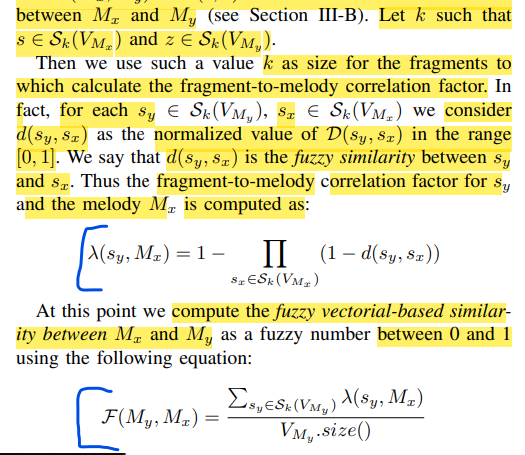

In [41]:
def all_lambda(k_shingles_x, k_shingles_y):

    #list lambda
    list_lambdas = []

    for s_y in k_shingles_y:
        
        #save all the distance before product
        distances = []

        for s_x in k_shingles_x:  
            distance_norm = np.linalg.norm(np.array(s_y) - np.array(s_x)) / max(np.linalg.norm(s_y), np.linalg.norm(s_x)) #d(sx,sy)
            distances.append(distance_norm)
        
        one_minus_distance = [1- d for d in distances] # (1-d(sy,sx))
        product_dist = np.prod(one_minus_distance)
        lambda_sy_Mx = 1 - product_dist
        list_lambdas.append(lambda_sy_Mx)

    return list_lambdas


In [44]:
#fuzzy
for i in range(len(list_threshold)): #or list_threshold_ori

    print("My:", list_threshold_ori[i]["name_song"])
    print("Mx:", list_threshold_plag[i]["name_song"])

    k = find_k(list_threshold_ori[i], list_threshold_plag[i])

    #creation Sk(Vm)
    sub_Vm_y = return_subset_of_Vm(list_threshold_ori[i]["Vm"], k) #sk (My)
    sub_Vm_x = return_subset_of_Vm(list_threshold_plag[i]["Vm"], k) #sk (Mx)
    #print(len(sub_Vm_y))
    #print(len(sub_Vm_x))


    #k -> shingles
    shi = 5

    #2)divide subset based on len k_shingles
    k_shingles_y = return_subset_shingles(sub_Vm_y, k_shingles) # sy E sk(My)
    #print("k_shingles_y:",k_shingles_y)
    k_shingles_x = return_subset_shingles(sub_Vm_x, k_shingles) # sx E sk(Mx)
    #print("k_shingles_x:", k_shingles_x)

    #compute lambdas
    lambda_factors = all_lambda(k_shingles_x, k_shingles_y)
    #print("lambda_factors:",lambda_factors)
    #compute fuzzy
    F_My_Mx = sum(lambda_factors) / len(list_threshold_ori[i]["Vm"])
    print("fuzzy:",F_My_Mx)

    list_threshold[i]["F_My_Mx"] = F_My_Mx
    

My: BMMDet_MPDSet-master\BMMDet_MPDSet-master\data\midi\dataset_real_ori\case10_Anftrag Deutsches Reich-Stahlgewitter.mid
Mx: BMMDet_MPDSet-master\BMMDet_MPDSet-master\data\midi\dataset_real_plag\case10_Schenkt uns Dummheit, kein Niveau-FreiWild.mid
fuzzy: 0.95
My: BMMDet_MPDSet-master\BMMDet_MPDSet-master\data\midi\dataset_real_ori\case15_Jingle of German bank.mid
Mx: BMMDet_MPDSet-master\BMMDet_MPDSet-master\data\midi\dataset_real_plag\case15_wouldn it be good.mid
fuzzy: 0.5430209893473685
My: BMMDet_MPDSet-master\BMMDet_MPDSet-master\data\midi\dataset_real_ori\case17_ma este meg.mid
Mx: BMMDet_MPDSet-master\BMMDet_MPDSet-master\data\midi\dataset_real_plag\case17_perhaps.mid
fuzzy: 0.8
My: BMMDet_MPDSet-master\BMMDet_MPDSet-master\data\midi\dataset_real_ori\case19_phantom Song.mid
Mx: BMMDet_MPDSet-master\BMMDet_MPDSet-master\data\midi\dataset_real_plag\case19_Till you.mid
fuzzy: 0.8222222222222222
My: BMMDet_MPDSet-master\BMMDet_MPDSet-master\data\midi\dataset_real_ori\case1_song_a.

C:\Users\elped\AppData\Local\Temp\ipykernel_12672\3397415913.py:12: RuntimeWarning: invalid value encountered in scalar divide
  distance_norm = np.linalg.norm(np.array(s_y) - np.array(s_x)) / max(np.linalg.norm(s_y), np.linalg.norm(s_x)) #d(sx,sy)


fuzzy: nan
My: BMMDet_MPDSet-master\BMMDet_MPDSet-master\data\midi\dataset_real_ori\case21_Here We Are On the Road Again.mid
Mx: BMMDet_MPDSet-master\BMMDet_MPDSet-master\data\midi\dataset_real_plag\case21_Filion Family Welcome.mid
fuzzy: 0.9047619047619248
My: BMMDet_MPDSet-master\BMMDet_MPDSet-master\data\midi\dataset_real_ori\case22_City of Violets.mid
Mx: BMMDet_MPDSet-master\BMMDet_MPDSet-master\data\midi\dataset_real_plag\case22_Chariots of Fire.mid
fuzzy: 0.7894736141215655
My: BMMDet_MPDSet-master\BMMDet_MPDSet-master\data\midi\dataset_real_ori\case25_There is nothin_ like a dame.mid
Mx: BMMDet_MPDSet-master\BMMDet_MPDSet-master\data\midi\dataset_real_plag\case25_Advert for Rapid Coach Service.mid
fuzzy: 0.765625
My: BMMDet_MPDSet-master\BMMDet_MPDSet-master\data\midi\dataset_real_ori\case28_he so fine.mid
Mx: BMMDet_MPDSet-master\BMMDet_MPDSet-master\data\midi\dataset_real_plag\case28_my sweet lord.mid
fuzzy: 0.82
My: BMMDet_MPDSet-master\BMMDet_MPDSet-master\data\midi\dataset

In [45]:
list_threshold

[{'plag_song': 'BMMDet_MPDSet-master\\BMMDet_MPDSet-master\\data\\midi\\dataset_real_plag\\case10_Schenkt uns Dummheit, kein Niveau-FreiWild.mid',
  'original_song': 'BMMDet_MPDSet-master\\BMMDet_MPDSet-master\\data\\midi\\dataset_real_ori\\case10_Anftrag Deutsches Reich-Stahlgewitter.mid',
  'ajs_vm': 0.8059197368421053,
  'ajs_rm': 0.9561447368421053,
  'F_My_Mx': 0.95},
 {'plag_song': 'BMMDet_MPDSet-master\\BMMDet_MPDSet-master\\data\\midi\\dataset_real_plag\\case15_wouldn it be good.mid',
  'original_song': 'BMMDet_MPDSet-master\\BMMDet_MPDSet-master\\data\\midi\\dataset_real_ori\\case15_Jingle of German bank.mid',
  'ajs_vm': 1.0,
  'ajs_rm': 1.0,
  'F_My_Mx': 0.5430209893473685},
 {'plag_song': 'BMMDet_MPDSet-master\\BMMDet_MPDSet-master\\data\\midi\\dataset_real_plag\\case17_perhaps.mid',
  'original_song': 'BMMDet_MPDSet-master\\BMMDet_MPDSet-master\\data\\midi\\dataset_real_ori\\case17_ma este meg.mid',
  'ajs_vm': 0.8352557692307696,
  'ajs_rm': 0.678251923076923,
  'F_My_Mx'

# FINAL RESULT WITH ALPHA THRESHOLD

In [46]:
alpha = 0.75

final = []

for i in list_threshold:
    if i["F_My_Mx"] >= alpha:
        final.append(i)

In [47]:
final

[{'plag_song': 'BMMDet_MPDSet-master\\BMMDet_MPDSet-master\\data\\midi\\dataset_real_plag\\case10_Schenkt uns Dummheit, kein Niveau-FreiWild.mid',
  'original_song': 'BMMDet_MPDSet-master\\BMMDet_MPDSet-master\\data\\midi\\dataset_real_ori\\case10_Anftrag Deutsches Reich-Stahlgewitter.mid',
  'ajs_vm': 0.8059197368421053,
  'ajs_rm': 0.9561447368421053,
  'F_My_Mx': 0.95},
 {'plag_song': 'BMMDet_MPDSet-master\\BMMDet_MPDSet-master\\data\\midi\\dataset_real_plag\\case17_perhaps.mid',
  'original_song': 'BMMDet_MPDSet-master\\BMMDet_MPDSet-master\\data\\midi\\dataset_real_ori\\case17_ma este meg.mid',
  'ajs_vm': 0.8352557692307696,
  'ajs_rm': 0.678251923076923,
  'F_My_Mx': 0.8},
 {'plag_song': 'BMMDet_MPDSet-master\\BMMDet_MPDSet-master\\data\\midi\\dataset_real_plag\\case19_Till you.mid',
  'original_song': 'BMMDet_MPDSet-master\\BMMDet_MPDSet-master\\data\\midi\\dataset_real_ori\\case19_phantom Song.mid',
  'ajs_vm': 0.5745243243243243,
  'ajs_rm': 0.3790378378378379,
  'F_My_Mx': 0